In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing import image
import pickle
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import cv2

In [2]:
train_dir = "train"
val_dir = "val"
test_dir = "test"

In [3]:
# Function to list classes and count images
def explore_data(directory):
    classes = os.listdir(directory)
    print(f"Classes disponibles : {classes}")
    for cls in classes:
        class_path = os.path.join(directory, cls)
        num_images = len(os.listdir(class_path))
        print(f"Classe : {cls}, Nombre d'images : {num_images}")
        
# Explore each set
print("Train set :")
explore_data(train_dir)

print("\nValidation set :")
explore_data(val_dir)

print("\nTest set :")
explore_data(test_dir)

Train set :
Classes disponibles : ['.ipynb_checkpoints', 'AbdomenCT', 'BreastMRI', 'ChestCT', 'CXR', 'Hand', 'HeadCT']
Classe : .ipynb_checkpoints, Nombre d'images : 0
Classe : AbdomenCT, Nombre d'images : 8000
Classe : BreastMRI, Nombre d'images : 7163
Classe : ChestCT, Nombre d'images : 8000
Classe : CXR, Nombre d'images : 8000
Classe : Hand, Nombre d'images : 8000
Classe : HeadCT, Nombre d'images : 8000

Validation set :
Classes disponibles : ['AbdomenCT', 'BreastMRI', 'ChestCT', 'CXR', 'Hand', 'HeadCT']
Classe : AbdomenCT, Nombre d'images : 1000
Classe : BreastMRI, Nombre d'images : 895
Classe : ChestCT, Nombre d'images : 1000
Classe : CXR, Nombre d'images : 1000
Classe : Hand, Nombre d'images : 1000
Classe : HeadCT, Nombre d'images : 1000

Test set :
Classes disponibles : ['AbdomenCT', 'BreastMRI', 'ChestCT', 'CXR', 'Hand', 'HeadCT']
Classe : AbdomenCT, Nombre d'images : 1000
Classe : BreastMRI, Nombre d'images : 896
Classe : ChestCT, Nombre d'images : 1000
Classe : CXR, Nombre d'

<Figure size 1200x600 with 0 Axes>

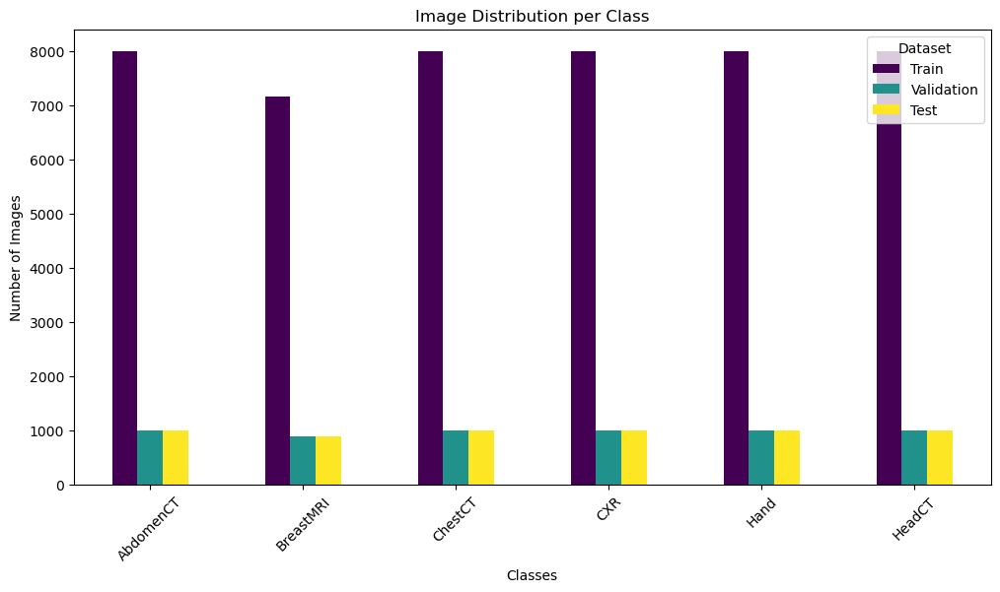

In [4]:
# Define the datasets
datasets = {"Train": train_dir, "Validation": val_dir, "Test": test_dir}

# Store classes and image counts
class_counts = {}


for dataset_name, dataset_path in datasets.items():
    classes = [cls for cls in os.listdir(dataset_path) if not cls.startswith('.')]  # Ignore les dossiers cachés
    num_images_per_class = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}
    class_counts[dataset_name] = num_images_per_class

# Convert to DataFrame
df_class_distribution = pd.DataFrame(class_counts).fillna(0)

# Plot class distribution histogram
plt.figure(figsize=(12, 6))
df_class_distribution.plot(kind='bar', figsize=(12,6), colormap='viridis')
plt.title("Image Distribution per Class")
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.legend(title="Dataset")
plt.show()


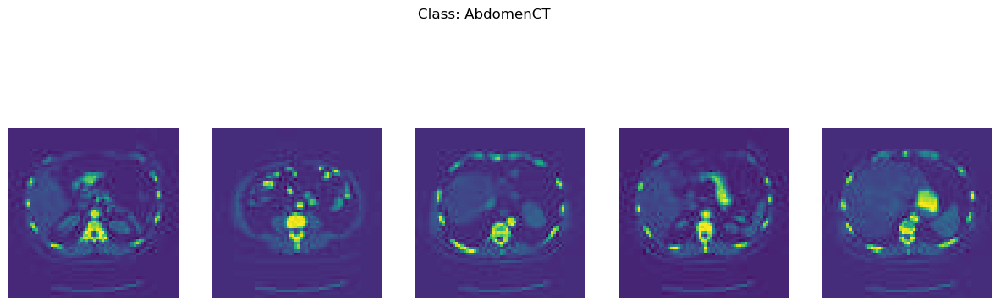

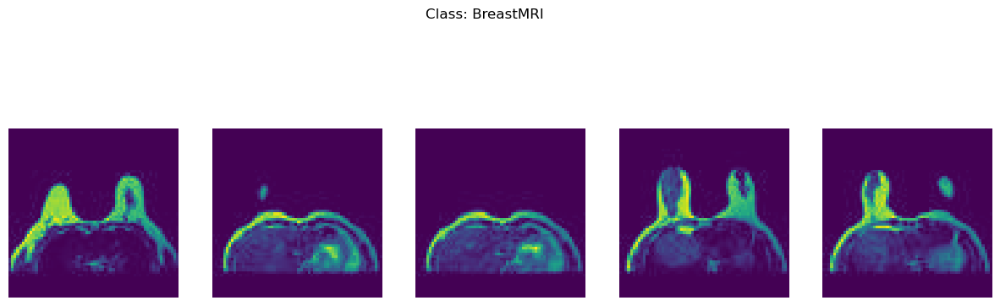

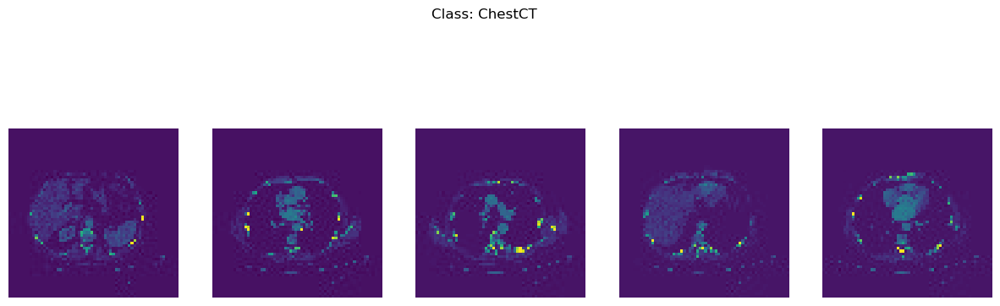

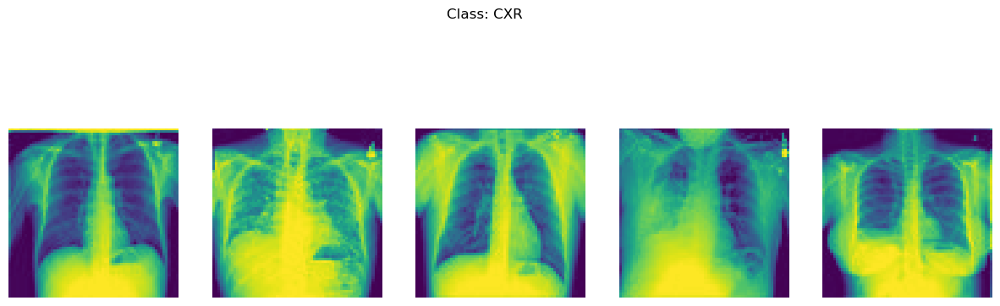

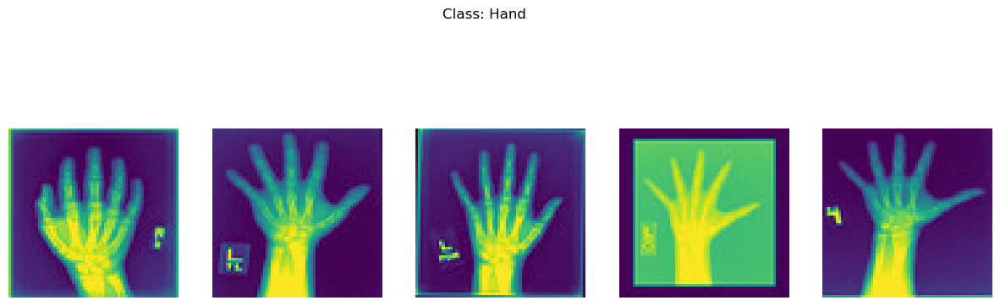

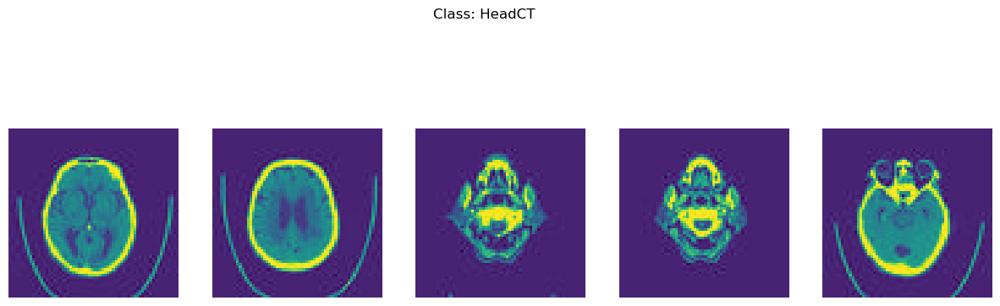

In [5]:
# Function to visualize a few images from each class
def visualize_images(directory, num_images=5):
    classes = [cls for cls in os.listdir(directory) if not cls.startswith('.')]  # Exclure les dossiers cachés
    for cls in classes:
        class_path = os.path.join(directory, cls)
        images = [img for img in os.listdir(class_path) if not img.startswith('.')]  # Exclure les images cachées
        images = images[:num_images]  # Limite le nombre d’images

        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
        for i, img_name in enumerate(images):
            img_path = os.path.join(class_path, img_name)
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
        plt.suptitle(f"Class: {cls}")
        plt.show()

# Visualize training images
visualize_images(train_dir)



In [6]:
# Function to display the size of images
def check_image_sizes(directory):
    classes = os.listdir(directory)
    for cls in classes:
        class_path = os.path.join(directory, cls)
        images = os.listdir(class_path)[:5]  # Vérifier quelques images
        print(f"Classe : {cls}")
        for img_name in images:
            img_path = os.path.join(class_path, img_name)
            with Image.open(img_path) as img:
                print(f"Image : {img_name}, Taille : {img.size}")  # (Largeur, Hauteur)
        print("-" * 30)


check_image_sizes(train_dir)

Classe : .ipynb_checkpoints
------------------------------
Classe : AbdomenCT
Image : 000000.jpeg, Taille : (64, 64)
Image : 000003.jpeg, Taille : (64, 64)
Image : 000004.jpeg, Taille : (64, 64)
Image : 000005.jpeg, Taille : (64, 64)
Image : 000006.jpeg, Taille : (64, 64)
------------------------------
Classe : BreastMRI
Image : 000000.jpeg, Taille : (64, 64)
Image : 000003.jpeg, Taille : (64, 64)
Image : 000004.jpeg, Taille : (64, 64)
Image : 000005.jpeg, Taille : (64, 64)
Image : 000006.jpeg, Taille : (64, 64)
------------------------------
Classe : ChestCT
Image : 000000.jpeg, Taille : (64, 64)
Image : 000003.jpeg, Taille : (64, 64)
Image : 000004.jpeg, Taille : (64, 64)
Image : 000005.jpeg, Taille : (64, 64)
Image : 000006.jpeg, Taille : (64, 64)
------------------------------
Classe : CXR
Image : 000000.jpeg, Taille : (64, 64)
Image : 000003.jpeg, Taille : (64, 64)
Image : 000004.jpeg, Taille : (64, 64)
Image : 000005.jpeg, Taille : (64, 64)
Image : 000006.jpeg, Taille : (64, 64)


In [7]:
# Generators for training, validation and testing
train_datagen = ImageDataGenerator(
    rescale=1./255,         # Normalisation des pixels  Cela accélère l'entraînement et améliore la stabilité du modèle
    rotation_range=20,      # Augmentation : rotation jusqu'à 20° Permet au modèle d’apprendre à reconnaître les images sous différents angles.
    width_shift_range=0.2,  # Décalage horizontal Rends le modèle plus robuste aux variations de position des objets dans l’image.
    height_shift_range=0.2, # Décalage vertical Rends le modèle plus robuste aux variations de position des objets dans l’image.
    zoom_range=0.2,         # Zoom Simule un effet de proximité ou éloignement de l’objet
    horizontal_flip=True    # Retourner horizontalement  Utile pour des images où la symétrie gauche-droite ne change pas la signification.
)

val_test_datagen = ImageDataGenerator(rescale=1./255)  # Seulement normalisation

In [8]:
# Set target image size and batch size
img_size = (64, 64)  # Image size
batch_size = 32      # Number of images per batch

# Generate the data
train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical' # it is mandatory to use categorical to encode labels in one-hot because multi-class classification
)

val_gen = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_gen = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Important for evaluation to keep the exact order of the images
)

Found 47163 images belonging to 7 classes.
Found 5895 images belonging to 6 classes.
Found 5896 images belonging to 6 classes.


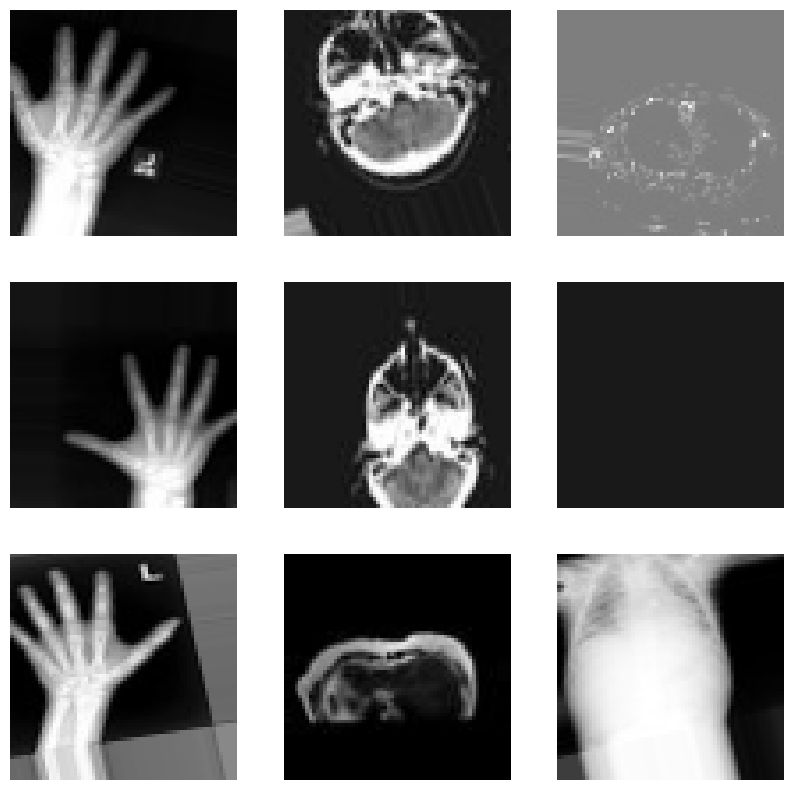

In [9]:
x_batch, y_batch = next(train_gen)

# Display images
plt.figure(figsize=(10, 10))
for i in range(9):  # Afficher 9 images
    plt.subplot(3, 3, i+1)
    plt.imshow(x_batch[i])
    plt.axis('off')
plt.show()

In [12]:
# Definition of the CNN model
#model = models.Sequential([
#    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)),  # Conv 1
#    layers.MaxPooling2D((2, 2)),  # Pooling
#    layers.Conv2D(64, (3, 3), activation='relu'),  # Conv 2
#   layers.MaxPooling2D((2, 2)),  # Pooling
#    layers.Conv2D(128, (3, 3), activation='relu'),  # Conv 3
#    layers.MaxPooling2D((2, 2)),  # Pooling
#    layers.Flatten(),  # Passage en vecteur
#    layers.Dense(128, activation='relu'),  # Couche dense
#    layers.Dense(6, activation='softmax')  # Couche de sortie (6 classes)
#])

# Definition of the CNN model for ES
#modelSL = models.Sequential([
#    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)),  # Conv 1
#    layers.MaxPooling2D((2, 2)),  # Pooling
#    layers.Conv2D(64, (3, 3), activation='relu'),  # Conv 2
#   layers.MaxPooling2D((2, 2)),  # Pooling
#    layers.Conv2D(128, (3, 3), activation='relu'),  # Conv 3
#    layers.MaxPooling2D((2, 2)),  # Pooling
#    layers.Flatten(),  # Passage en vecteur
#    layers.Dense(128, activation='relu'),  # Couche dense
#    layers.Dense(6, activation='softmax')  # Couche de sortie (6 classes)
#])



# Compiling the model
#model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
#modelSL.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model Summary
#model.summary()
#modelSL.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 31, 31, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 14, 14, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 128)         0

In [13]:
#history = model.fit(
#    train_gen,
#    epochs=20,
#    validation_data=val_gen
#)

In [14]:
#early_stopping = EarlyStopping(
#    monitor="val_loss",  # Surveiller la perte de validation
#    patience=3,  # Arrêter si aucune amélioration après 3 epochs
#    restore_best_weights=True  # Récupérer le meilleur modèle
#)

#historySL = modelSL.fit(
#    train_gen,
#    epochs=20,  # Toujours mettre un nombre grand, l'early stopping arrêtera avant
#    validation_data=val_gen,
#    callbacks=[early_stopping]  # Ajout du callback
#)

In [15]:
#with open("history.pkl", "wb") as f:
#    pickle.dump(history.history, f)
    
#with open("historySL.pkl", "wb") as f:
#    pickle.dump(historySL.history, f)    
    
#model.save(r"CNN_model.keras")
#modelSL.save(r"CNN_model_SL.keras")    

In [10]:
with open("history.pkl", "rb") as f:
    history = pickle.load(f)
    
with open("historySL.pkl", "rb") as f:
    historySL = pickle.load(f)
    
model = keras.models.load_model(r"CNN_model.keras")
modelSL = keras.models.load_model(r"CNN_model_SL.keras")    

In [11]:
test_loss, test_acc = model.evaluate(test_gen)
print(f"Test Accuracy: {test_acc:.4f}, Test Loss: {test_loss:.4f}")


test_loss_SL, test_acc_SL = modelSL.evaluate(test_gen)
print(f"Test Accuracy with early stopping: {test_acc_SL:.4f}, Test Loss with early stopping: {test_loss_SL:.4f}")

185/185 [==============================] - 38s 205ms/step - loss: 5.7649e-04 - accuracy: 0.9998
Test Accuracy: 0.9998, Test Loss: 0.0006
185/185 [==============================] - 3s 18ms/step - loss: 0.0013 - accuracy: 0.9993
Test Accuracy with early stopping: 0.9993, Test Loss with early stopping: 0.0013


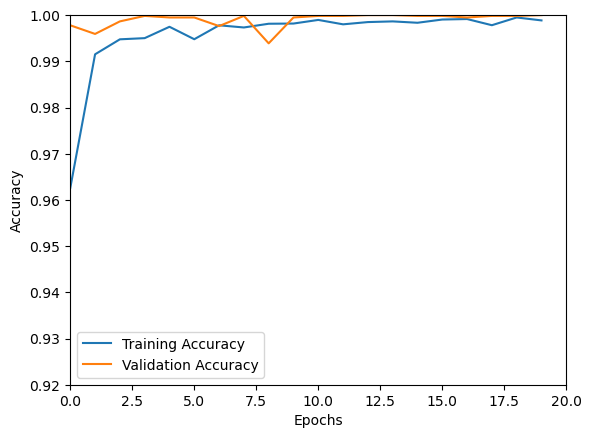

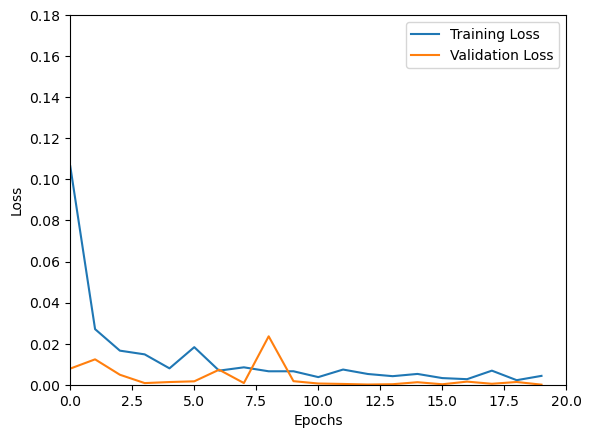

In [12]:
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0.92, 1) 
plt.xlim(0, 20) 
plt.legend()
plt.show()

plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0.0, 0.18)  
plt.xlim(0, 20)
plt.legend()
plt.show()


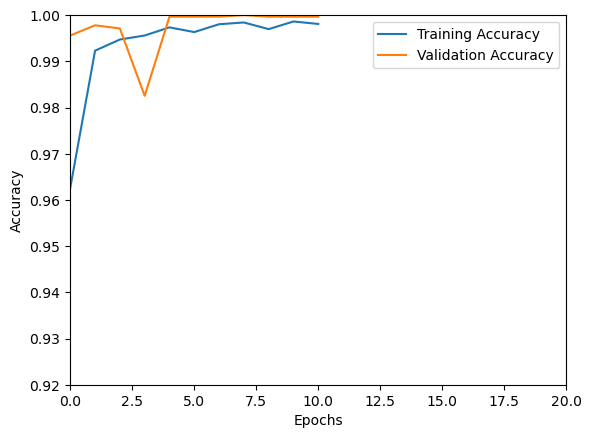

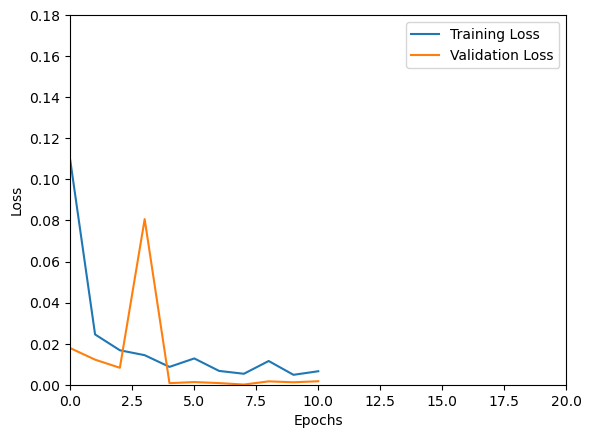

In [13]:
plt.plot(historySL['accuracy'], label='Training Accuracy')
plt.plot(historySL['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0.92, 1) 
plt.xlim(0, 20)
plt.legend()
plt.show()

plt.plot(historySL['loss'], label='Training Loss')
plt.plot(historySL['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0.0, 0.18)  
plt.xlim(0, 20)
plt.legend()
plt.show()


1/1 [==============================] - 0s 89ms/step


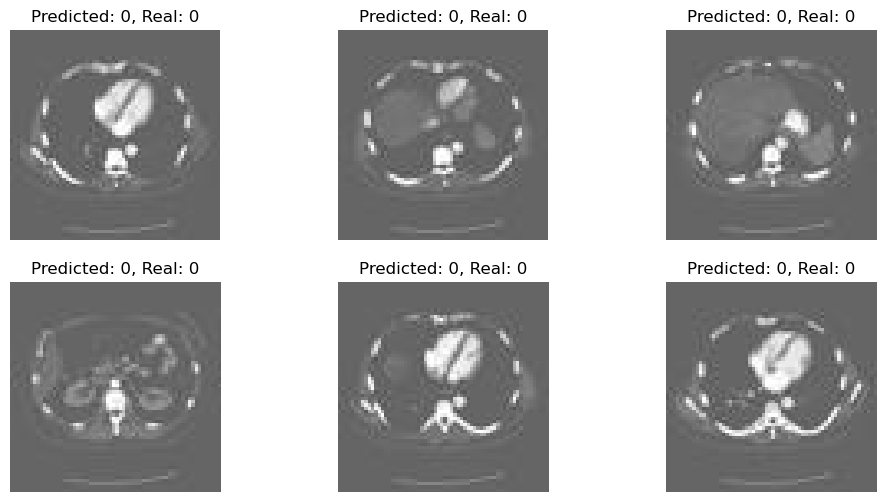

In [14]:
# Get a batch of test images
x_test, y_test = next(iter(test_gen))  

# Making the prediction
predictions = model.predict(x_test)


predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)  

# Show some results
plt.figure(figsize=(12,6))
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(x_test[i])  # Afficher l'image
    plt.title(f"Predicted: {predicted_classes[i]}, Real: {true_classes[i]}")
    plt.axis('off')

plt.show()


In [15]:
img_path = "test/Hand/000070.jpeg"
img = image.load_img(img_path, target_size=(64, 64))  # Taille d'entrée du modèle

# Convert to numpy array
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension batch
img_array = img_array / 255.0  # Normalisation (si ton modèle le nécessite)

# Making the prediction
prediction = model.predict(img_array)
predicted_class = np.argmax(prediction)

print(f"Classe prédite : {predicted_class}")


1/1 [==============================] - 0s 63ms/step
Classe prédite : 4


In [16]:
test_folder = "test\CXR"
test_images = [os.path.join(test_folder, img) for img in os.listdir(test_folder)]

for img_path in test_images:
    img = image.load_img(img_path, target_size=(64, 64))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)

    print(f"Image: {img_path} --> Prédit: {predicted_class}")


1/1 [==============================] - 0s 17ms/step
Image: test\CXR\000001.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\000002.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\000024.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\000026.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\000034.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\000037.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\000047.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\000070.jpeg --> Prédit: 2
1/1 [==============================] - 0s 16ms/step
Image: test\CXR\000084.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\000115.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: t

1/1 [==============================] - 0s 15ms/step
Image: test\CXR\001790.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\001808.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\001809.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\001824.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\001828.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\001837.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\001840.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\001862.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\001875.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\001885.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: t

1/1 [==============================] - 0s 13ms/step
Image: test\CXR\003648.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\003650.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\003661.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\003664.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\003687.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\003699.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\003707.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\003709.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\003713.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\003723.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: t

1/1 [==============================] - 0s 14ms/step
Image: test\CXR\005281.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\005282.jpeg --> Prédit: 2
1/1 [==============================] - 0s 16ms/step
Image: test\CXR\005285.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\005288.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\005298.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\005311.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\005313.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\005314.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\005325.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\005337.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: t

1/1 [==============================] - 0s 14ms/step
Image: test\CXR\006996.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\007015.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\007034.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\007038.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\007041.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\007044.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\007055.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\007080.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\007081.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\007086.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: t

1/1 [==============================] - 0s 14ms/step
Image: test\CXR\008781.jpeg --> Prédit: 2
1/1 [==============================] - 0s 16ms/step
Image: test\CXR\008782.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\008815.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\008820.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\008823.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: test\CXR\008845.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\008846.jpeg --> Prédit: 2
1/1 [==============================] - 0s 15ms/step
Image: test\CXR\008849.jpeg --> Prédit: 2
1/1 [==============================] - 0s 16ms/step
Image: test\CXR\008854.jpeg --> Prédit: 2
1/1 [==============================] - 0s 14ms/step
Image: test\CXR\008855.jpeg --> Prédit: 2
1/1 [==============================] - 0s 13ms/step
Image: t

185/185 [==============================] - 3s 16ms/step
Number of errors : 1


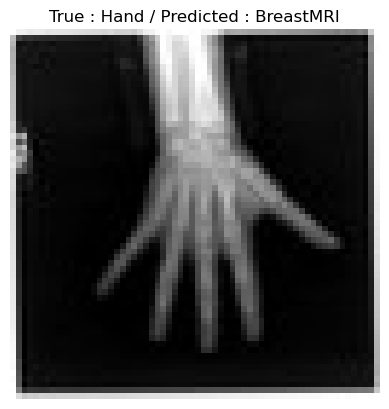

In [17]:
# Reset the generator to the beginning
test_gen.reset()

# Get the predictions
preds = model.predict(test_gen)
predicted_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

# Find the indice of errors
errors = np.where(predicted_classes != true_classes)[0]

print(f"Number of errors : {len(errors)}")

batch_size = test_gen.batch_size

for i in errors[:5]:
    batch_index = i // batch_size
    image_index = i % batch_size

    batch = test_gen[batch_index]           # Retrieve the batch
    image = batch[0][image_index]           
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    plt.imshow(image)
    plt.title(f"True : {true_label} / Predicted : {predicted_label}")
    plt.axis('off')
    plt.show()

In [18]:
probas = preds[errors[0]]
print(f"Prediction Probabilities :\n{probas}")


Prediction Probabilities :
[3.1805942e-17 9.4725680e-01 3.0662924e-11 2.7380532e-22 5.2740607e-02
 2.5539200e-06]


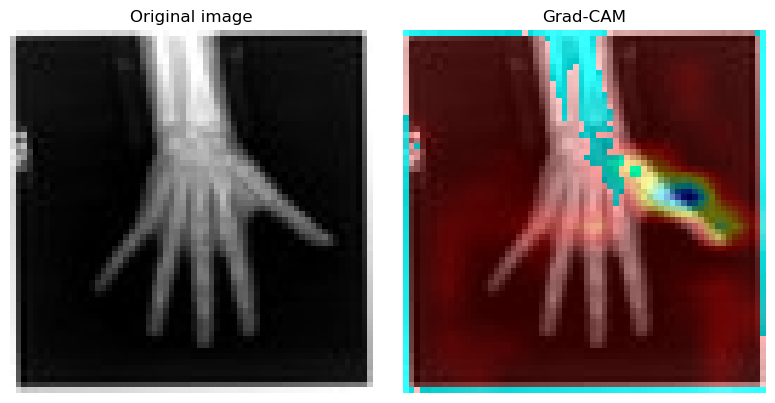

In [19]:
# Recover the misclassified image
img = image  

# Resize
img_input = np.expand_dims(img, axis=0)

# Last convolutional layer of the model
last_conv_layer_name = [layer.name for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)][-1]
last_conv_layer = model.get_layer(last_conv_layer_name)

# Create a model that gives the activations of this layer AND the prediction
grad_model = tf.keras.models.Model(
    [model.inputs],
    [last_conv_layer.output, model.output]
)

# Gradient calculation
with tf.GradientTape() as tape:
    conv_outputs, predictions = grad_model(img_input)
    class_index = np.argmax(predictions[0])
    output = predictions[:, class_index]

grads = tape.gradient(output, conv_outputs)
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

# Weight activation cards
heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1).numpy()[0]
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

# Overlay the heatmap on top of the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superposed_img = heatmap * 0.4 + img * 255
superposed_img = np.uint8(superposed_img)

# Display
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(superposed_img)
plt.title("Grad-CAM")
plt.axis('off')

plt.tight_layout()
plt.show()


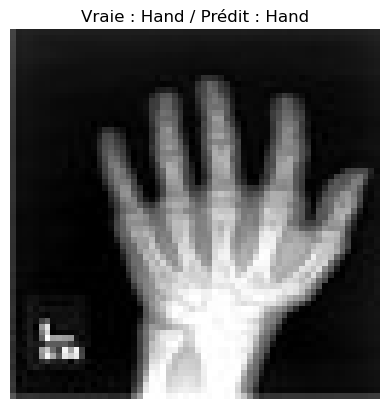

In [20]:
# Find a well-predicted images
corrects = np.where(predicted_classes == true_classes)[0]

# Find the index of the "Hand" class
hand_class_index = class_labels.index("Hand")

# Filter among the good predictions those that are of the "Hand" class
hand_corrects = [i for i in corrects if true_classes[i] == hand_class_index]

# Select the first or another if we want
i = hand_corrects[1]  

batch_size = test_gen.batch_size
batch_index = i // batch_size
image_index = i % batch_size

batch = test_gen[batch_index]
image = batch[0][image_index]  # Image (X)
true_label = class_labels[true_classes[i]]
predicted_label = class_labels[predicted_classes[i]]

plt.imshow(image)
plt.title(f"Vraie : {true_label} / Prédit : {predicted_label}")
plt.axis('off')
plt.show()

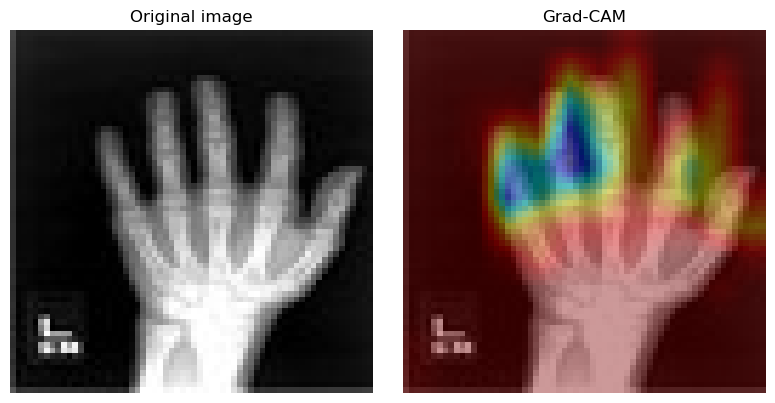

In [21]:
# Preparing the image
if isinstance(image, np.ndarray):
    img_tensor = tf.convert_to_tensor(image[np.newaxis, ...])
else:
    img_tensor = tf.expand_dims(image, axis=0)

# Automatic detection of the last conv2D layer
for layer in reversed(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        layer_name = layer.name
        break

# Creating the Staging Model to Extract Activations and Output
grad_model = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=[model.get_layer(layer_name).output, model.output]
)

# Calculating the gradient of the output with respect to the last conv layer
with tf.GradientTape() as tape:
    conv_outputs, predictions = grad_model(img_tensor)
    loss = predictions[:, hand_class_index]

grads = tape.gradient(loss, conv_outputs)
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

# Heatmap construction
conv_outputs = conv_outputs[0]
heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)

heatmap = np.maximum(heatmap, 0)
heatmap /= tf.math.reduce_max(heatmap)

# Resize + overlay with original image
heatmap = cv2.resize(heatmap.numpy(), (image.shape[1], image.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

image_disp = np.uint8(255 * image)
superposed = cv2.addWeighted(image_disp, 0.6, heatmap_color, 0.4, 0)

# Display
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].imshow(image)
axs[0].set_title("Original image")
axs[0].axis('off')

axs[1].imshow(superposed)
axs[1].set_title("Grad-CAM")
axs[1].axis('off')
plt.tight_layout()
plt.show()


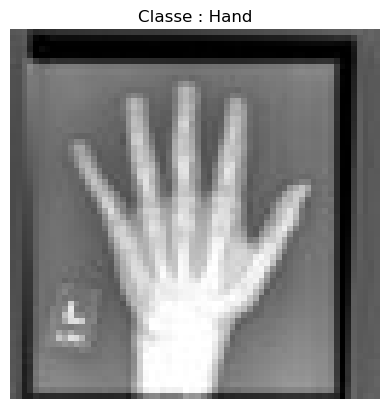

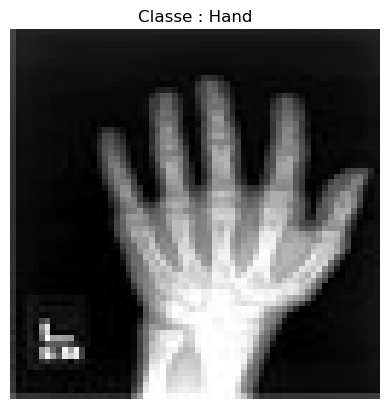

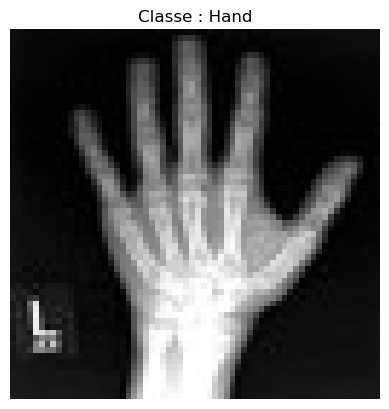

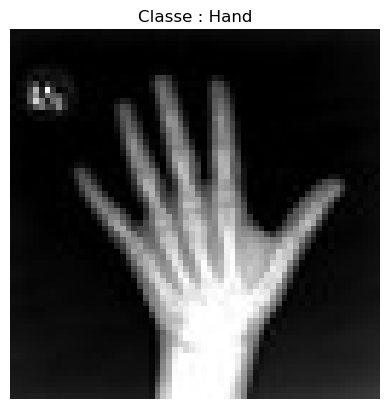

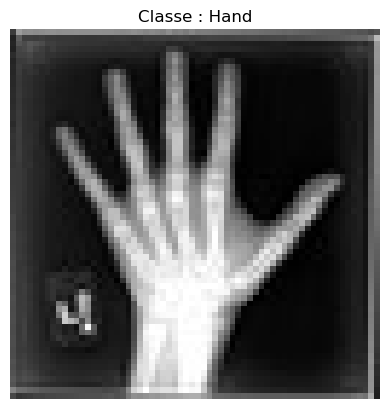

...

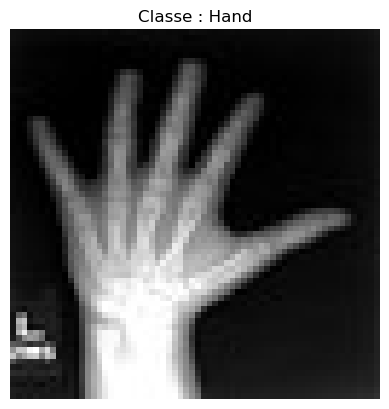

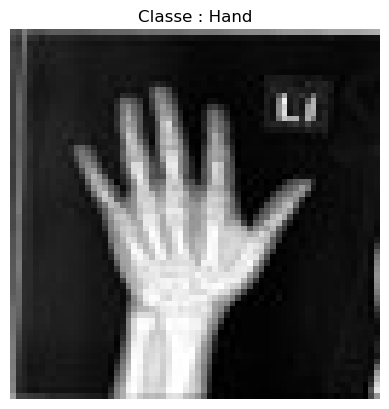

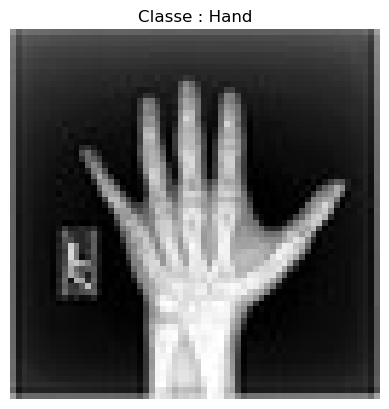

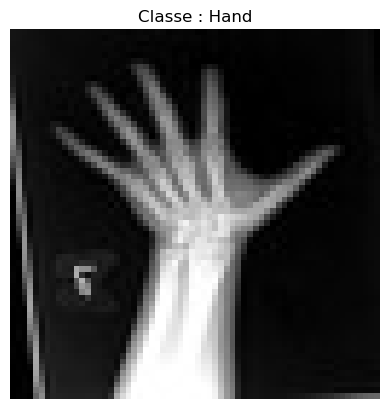

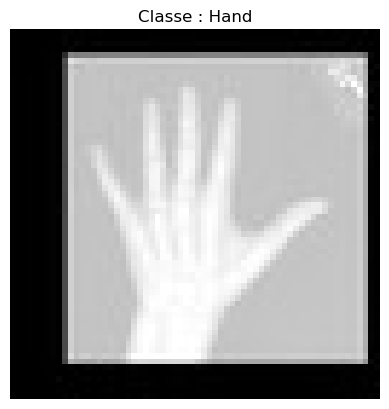

In [22]:
test_gen.reset()

target_class = "Hand"
class_indices = test_gen.class_indices
target_index = class_indices[target_class]

shown = 0

for images, labels in test_gen:
    for i in range(len(images)):
        class_index = labels[i].argmax()
        if class_index == target_index:
            plt.imshow(images[i])
            plt.title(f"Classe : {target_class}")
            plt.axis('off')
            plt.show()
            shown += 1
        
        if shown >= 1000:
            break
    if shown >= 1000:
        break



185/185 [==============================] - 3s 17ms/step


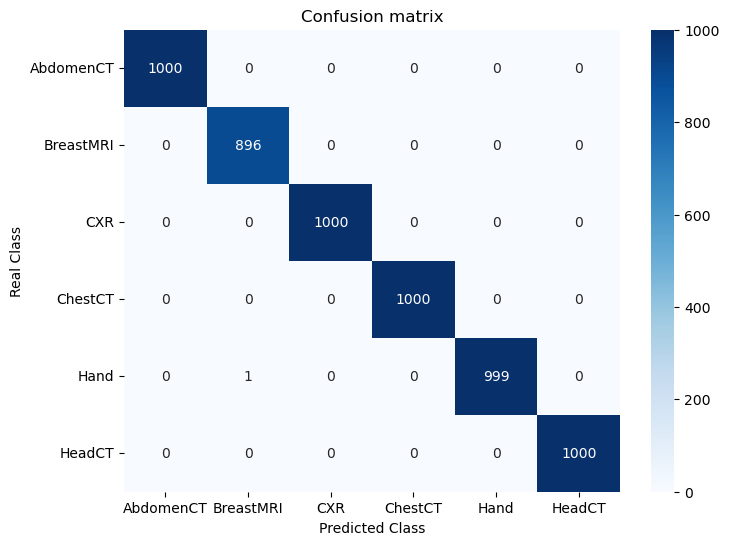

In [23]:
test_gen.reset()

# Prédictions
preds = model.predict(test_gen)
predicted_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Class")
plt.ylabel("Real Class")
plt.title("Confusion matrix")
plt.show()

In [24]:
report_dict = classification_report(true_classes, predicted_classes, target_names=class_labels, output_dict=True)
df_report = pd.DataFrame(report_dict).transpose()
print(df_report)


              precision    recall  f1-score     support
AbdomenCT      1.000000  1.000000  1.000000  1000.00000
BreastMRI      0.998885  1.000000  0.999442   896.00000
CXR            1.000000  1.000000  1.000000  1000.00000
ChestCT        1.000000  1.000000  1.000000  1000.00000
Hand           1.000000  0.999000  0.999500  1000.00000
HeadCT         1.000000  1.000000  1.000000  1000.00000
accuracy       0.999830  0.999830  0.999830     0.99983
macro avg      0.999814  0.999833  0.999824  5896.00000
weighted avg   0.999831  0.999830  0.999830  5896.00000
